In [10]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from scipy import signal
from matplotlib import animation, rc
from IPython.display import HTML
%matplotlib inline

In [2]:
def PILDisplay(image):
    return Image.fromarray(image).resize((500,500)).convert("RGB")

In [3]:
def MatPlot(image):
    plt.imshow(image, cmap='gray')
    plt.show()

In [4]:
def PlotMask(image,mask):
    data_masked = np.ma.masked_where(mask == 0, mask)
    plt.imshow(image,cmap='gray')
    plt.imshow(data_masked,interpolation = 'none', vmin=0, alpha=0.8)
    plt.show()

In [5]:
def Reverse(lst):
    return [el for el in reversed(lst)]

In [6]:
def focus(image):
    
    border = 0
    top = (500,500)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if image[i][j]!=0  and top[1] > j:
                top = (i,j)
        if top != (500,500):
            break
            
    left = (500,500)
    for j in range(image.shape[1]):
        for i in range(image.shape[0]):
            if image[i][j]!=0 and left[0] > i:
                left = (i,j)
        if left !=(500,500) :
            break
            
    right = (-1,-1)
    for j in reversed(range(image.shape[1])):
        for i in range(image.shape[0]):
            if image[i][j]!=0 and right[0] < i:
                right = (i,j)
        if right != (-1,-1) :
            break
    down = (-1,-1)
    
    for i in reversed(range(image.shape[0])):
        for j in range(image.shape[1]):
            if image[i][j]!=0 and down[1] < j:
                down = (i,j)
        if(down != (-1,-1)):
            break
    top_border = max(0,top[0]-border)
    down_border = min(image.shape[0], down[0]+border)
    left_border = max(0,left[1]-border)
    right_border = min(image.shape[1],right[1]+border)
    return image[top_border:down_border,left_border:right_border],top,left,right,down

In [7]:
def convolve2D(image, kernel, padding=1, strides=1, blackout=True):
    # Cross Correlation
    kernel = np.flipud(np.fliplr(kernel))

    # Gather Shapes of Kernel + Image + Padding
    xKernShape = kernel.shape[0]
    yKernShape = kernel.shape[1]
    xImgShape = image.shape[0]
    yImgShape = image.shape[1]

    # Shape of Output Convolution
    xOutput = int(((xImgShape - xKernShape + 2 * padding) / strides) + 1)
    yOutput = int(((yImgShape - yKernShape + 2 * padding) / strides) + 1)
    output = np.zeros((xOutput, yOutput))

    # Apply Equal Padding to All Sides
    if padding != 0:
        imagePadded = np.zeros((image.shape[0] + padding*2, image.shape[1] + padding*2))
        imagePadded[int(padding):int(-1 * padding), int(padding):int(-1 * padding)] = image
    else:
        imagePadded = image

    # Iterate through image
    for y in range(image.shape[1]):
        # Exit Convolution
        if y > image.shape[1] - yKernShape:
            break
        # Only Convolve if y has gone down by the specified Strides
        if y % strides == 0:
            for x in range(image.shape[0]):
                # Go to next row once kernel is out of bounds
                if x > image.shape[0] - xKernShape:
                    break
                try:
                    # Only Convolve if x has moved by the specified Strides
                    if x % strides == 0:
                        
                        if imagePadded[x: x + xKernShape, y: y + yKernShape].all():
                            output[x, y] = np.abs((kernel * imagePadded[x: x + xKernShape, y: y + yKernShape]).sum())
                        else: 
                            output[x, y] = 0
                except:
                    break

    return output

In [8]:
def padImage(image,padding=1):
    new_image = np.zeros((image.shape[0]+(2*padding),image.shape[1]+(2*padding)))
    new_image[1*padding:-1*padding,1*padding:-1*padding] = image
    return new_image

In [9]:
def unpadImage(image):
    new_image = np.zeros((image.shape[0]-2,image.shape[1]-2))
    new_image = image[1:-1,1:-1]
    return new_image

In [10]:
def border_idx(image,i,j):
    if(i < 0 or i >= image.shape[0]):
        i = 0
    if(j < 0 or j >= image.shape[1]):
        j = 0
    return image[i][j]

In [11]:
def segment(image_path, seg_image_path, thres = 0.35, label=1):
    """
    Creates a segmentation of papillary muscles
    Args:
        image_path string
            path to the nifti image
        seg_image_path tresh
            path to the left ventricle segmented nifti image
        thres float (0,1) 
            threshold for how dark we want it
        label int
            label of the left ventricle used in seg_image_path
    Return:
        masked_image ar of shape (frame_width,frame_height,number_of_cuts,time)
            each frame in each cut is showing papillary segmentation
    """
    nim = nib.load(image_path)
    image = nim.get_fdata()
    seg_nim = nib.load(seg_image_path)
    seg_image = seg_nim.get_fdata()
    
    cnt=0
    masked_image = np.zeros_like(image)
    for cut in range(image.shape[2]):
        for frame_id in range(image.shape[3]):
            cnt+=1
            frame = image[:,:,cut,frame_id]
            seg_frame = seg_image[:,:,cut,frame_id]
            try:
                img,top,left,right,down = focus( (frame) * (seg_frame==label))
                img=img / np.max(img)
                thresh_img = np.copy(img)
                thresh_img[thresh_img<thres]=0
                imgray = (255*thresh_img).astype(np.uint8)
                contours, hierarchy = cv2.findContours(imgray, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
                contours = Reverse(sorted(contours, key = len))
                cont=contours[0]
                blank1 = np.zeros( (img.shape[0],img.shape[1]))
                blank2 = np.zeros( (img.shape[0],img.shape[1]))
                hull = cv2.convexHull(cont, returnPoints=True)
                hull = np.int0(hull)
                cv2.drawContours(blank1,[hull],-1,(147,0,255),thickness=1)
                cv2.drawContours(blank2,[hull],-1,(147,0,255),thickness=cv2.FILLED)
                mask = np.copy(img)
                mask[ (blank2-blank1)==0] =0
                mask[img>thres]=0
                mask[mask>0]=1
                whole_mask = np.zeros_like(frame)
                whole_mask[top[0]:down[0],left[1]:right[1]] = mask

                masked_image[:,:,cut,frame_id] = whole_mask
            except:
                masked_image[:,:,cut,frame_id] = np.zeros(frame.shape)
    return image,masked_image

In [12]:
def create_video(orig_image,masked_image,cut=6):
    fig, ax = plt.subplots()
    plt.close()
    def animator(N): # N is the animation frame number
        ax.imshow(orig_image[:,:,cut,N], cmap='gray') # I would add interpolation='none'
        data_masked = np.ma.masked_where(masked_image[:,:,cut,N] == 0, masked_image[:,:,cut,N])
        ax.imshow(data_masked,interpolation = 'none', vmin=0, alpha=0.8)
        return ax
    PlotFrames = range(0,masked_image.shape[3],1)
    anim = animation.FuncAnimation(fig,animator,frames=PlotFrames,interval=100)
    rc('animation', html='jshtml') # embed in the HTML for Google Colab
    return anim

maybe if pixel is by itself delete it

In [13]:
def make_kernel(size=1):
  side = 1 + 2*size
  dx = np.zeros((side, side))
  center = [int(side/2), int(side/2)]
  for i in range(0,side):
    for j in range(0,side):
      dx[i][j] = 1/dist([i,j],center)
  dx[:,center[0]]=0
  dx = dx / np.sum(np.abs(dx))
  #print(dx)
  #print()
  #print(dx.T)
  return [dx, dx.T]

make segmenation better by saying if surrounding pixels are color than the pixel has higher chance to be colored

# Short axis segmentation

In [14]:
image_path = "demo_image/1000012/sa.nii.gz"
seg_image_path = "demo_image/1000012/seg_sa.nii.gz"
orig,masked = segment(image_path,seg_image_path,thres=0.40)
create_video(orig,masked,cut=6)

<ipython-input-11-e4557554d000>:31: RuntimeWarning: invalid value encountered in true_divide
  img=img / np.max(img)


## Long axis papillary muscle segmentation

In [15]:
image_path = "demo_image/1000012/la_4ch.nii.gz"
seg_image_path = "demo_image/1000012/seg4_la_4ch.nii.gz"
orig,masked = segment(image_path,seg_image_path,thres=0.5)
create_video(orig,masked,cut=0)

## Edge detection to test this fractal thingy

In [19]:
def edges(gray):
    mask = np.zeros(gray.shape)
    for i in range(1,gray.shape[0]-1):
        for j in range(1,gray.shape[1]-1):
                mask[i][j] = np.sqrt((0.25 * gray[i+1][j] - 0.25* gray[i-1][j] + 
                            0.125*gray[i+1][j+1] + 0.125*gray[i+1][j-1] -  
                            0.125*gray[i-1][j+1] - 0.125* gray[i-1][j-1])**2 +  \
                            (0.25*gray[i][j+1]- 0.25*gray[i][j-1] + 
                            0.125*gray[i+1][j+1] + 0.125*gray[i-1][j+1] - 
                            0.125*gray[i+1][j-1] - 0.125*gray[i-1][j-1])**2)
  ## TODO: CONSIDER MINIMUM
    mask = mask/(np.max(mask)-np.min(mask))
    return mask
def fractal_dim(image_path, seg_image_path):
    nim = nib.load(image_path)
    image = nim.get_fdata()
    seg_nim = nib.load(seg_image_path)
    seg_image = seg_nim.get_fdata()
    masked_image = np.zeros_like(image)
    for cut in range(image.shape[2]):
        for frame_id in range(image.shape[3]):
            try:
                frame = image[:,:,cut,frame_id]
                seg_frame = seg_image[:,:,cut,frame_id]
                img,top,left,right,down = focus( (frame) * (seg_frame==1))
                img = (img/np.max(img))*255
                img = img.astype(np.uint8)
                kernel = np.ones((2,2),np.uint8)
                cc = cv2.erode(img,kernel)> 0.5*255
                mask = edges(cc)
                whole_mask = np.zeros_like(frame)
                whole_mask[top[0]:down[0],left[1]:right[1]] = mask
                masked_image[:,:,cut,frame_id] = whole_mask
            except:
                masked_image[:,:,cut,frame_id] = np.zeros(frame.shape)
    return image,masked_image

In [20]:
image_path = "demo_image/1000012/sa.nii.gz"
seg_image_path = "demo_image/1000012/seg_sa.nii.gz"
image,masked_image = fractal_dim(image_path, seg_image_path)
create_video(image,masked_image,cut=6)

<ipython-input-19-fe7d22ab3a14>:12: RuntimeWarning: invalid value encountered in true_divide
  mask = mask/(np.max(mask)-np.min(mask))
<ipython-input-19-fe7d22ab3a14>:26: RuntimeWarning: invalid value encountered in true_divide
  img = (img/np.max(img))*255


## TODO: Make convoluton faster

# Mass of papillary muscles

In [24]:
def get_papillary_mass(image_path,seg_image_path):
    nim = nib.load(image_path)
    X,Y,Z,T = image = nim.get_fdata().shape
    pixdim = nim.header['pixdim'][1:4]
    volume_per_pix = pixdim[0] * pixdim[1] * pixdim[2] * 1e-3
    density = 1.055
    image,segmented_image = segment(image_path,seg_image_path)
    mass_per_frame = np.sum(np.sum(np.sum(segmented_image,axis=0),axis=0),axis=0)*density*volume_per_pix
    return mass_per_frame

In [25]:
image_path = "demo_image/1000012/sa.nii.gz"
seg_image_path = "demo_image/1000012/seg_sa.nii.gz"
mass_per_frame = get_papillary_mass(image_path,seg_image_path)

<ipython-input-11-e4557554d000>:31: RuntimeWarning: invalid value encountered in true_divide
  img=img / np.max(img)


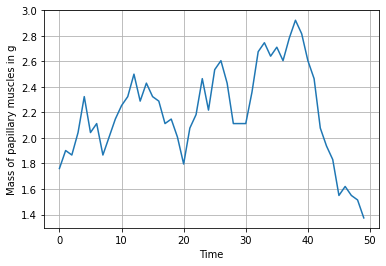

In [26]:
plt.plot(mass_per_frame)
plt.ylabel("Mass of papillary muscles in g")
plt.xlabel("Time")
plt.grid()
plt.show()

# Position of papillary muscles

Should build a function that returns the image of (original, small bounding box, big bounding box and the distance between two)

In [1]:
image_path = "demo_image/1000012/la_4ch.nii.gz"
seg_image_path = "demo_image/1000012/seg4_la_4ch.nii.gz"
nim = nib.load(image_path)
image = nim.get_fdata()
seg_nim = nib.load(seg_image_path)
seg_image = seg_nim.get_fdata()
# for loop here
cut=0
frame_id=20
label=1
thres=0.45
frame = image[:,:,cut,frame_id]
seg_frame = seg_image[:,:,cut,frame_id]
img,top,left,right,down = focus( (frame) * (seg_frame==label))
img=img / np.max(img)
thresh_img = np.copy(img)
thresh_img[thresh_img<thres]=0
imgray = (255*thresh_img).astype(np.uint8)
contours, hierarchy = cv2.findContours(imgray, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
contours = Reverse(sorted(contours, key = len))
cont=contours[0]
blank1 = np.zeros( (img.shape[0],img.shape[1]))
blank2 = np.zeros( (img.shape[0],img.shape[1]))
hull = cv2.convexHull(cont, returnPoints=True)
hull = np.int0(hull)
cv2.drawContours(blank1,[hull],-1,(147,0,255),thickness=1)
cv2.drawContours(blank2,[hull],-1,(147,0,255),thickness=cv2.FILLED)
mask = np.copy(img)
mask[ (blank2-blank1)==0] =0
mask[img>thres]=0
mask[mask>0]=1

PlotMask(img, mask)

NameError: name 'nib' is not defined

In [2]:
imgray = (255*mask).astype(np.uint8)
contours, hierarchy = cv2.findContours(imgray, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

NameError: name 'mask' is not defined

In [3]:
cont=contours[1]
blank_image=np.zeros( (img.shape[0],img.shape[1],3))
cv2.drawContours(blank_image, [cont], -1, color=(255, 255, 255), thickness=cv2.FILLED)
MatPlot(blank_image)
rect = cv2.minAreaRect(cont)
box = cv2.boxPoints(rect)
box = np.int0(box)
cv2.drawContours(blank_image,[box], 0,(255,0,0), 2)
MatPlot(blank_image)
save_box = box

NameError: name 'contours' is not defined

In [4]:
img = (img/np.max(img)*255).astype(np.uint8)
imgray = np.copy(img)
contours, hierarchy = cv2.findContours(imgray, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

NameError: name 'img' is not defined

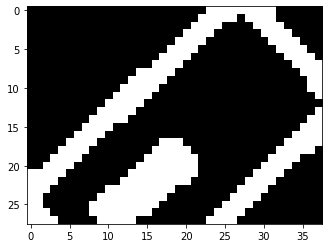

In [31]:
cont=contours[0]
blank_image=np.zeros( (img.shape[0],img.shape[1]))
rect = cv2.minAreaRect(cont)
box = cv2.boxPoints(rect)
box = np.int0(box)
cv2.drawContours(blank_image,[box], 0,(255,0,0), 2)
cv2.drawContours(blank_image,[save_box], 0,(255,0,0), 2)
MatPlot(blank_image)

In [32]:
whole_mask = np.zeros_like(frame)
whole_mask[top[0]:down[0],left[1]:right[1]] = blank_image

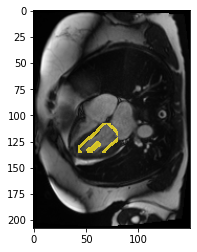

In [33]:
PlotMask(frame,whole_mask)

In [14]:
cat MeanPapillaryMass.csv

1000012,2.2035786316818236
1000158,6.579098707461547
1000243,3.8844465549568166
1000262,3.221914697256088
1000369,2.5951378490467065
1000489,1.9451209603981012
1000490,5.571975756216431
1000542,2.7003524336036677
1000563,2.993035853195191
1000670,3.3740317112136835
1000816,3.0423329143066407
1001023,2.498656469041442
1001100,4.6811075393795
1001231,3.663475884310912
1001363,2.7226059496376034
1001483,2.326821284460449
1001525,3.396567122375107
1001614,7.532282195949555
1001620,2.301685191327667
1001740,2.6688867406677246
1001993,3.308537044308472
1002013,3.013878843115234
1002097,2.086673933982467
1002226,2.737115468743515
1002291,3.1536030632377616
1002347,3.5942881911613465
1002595,4.59302897793274
1002625,2.608385157466125
1003057,2.31907460342865
1003125,2.2662560646492
1003167,1.898640879519653
1003227,3.9409474635726927
1003253,1.329612162548828
1003265,2.52612226009674
1003307,3.2261405278793323
1003558,6.5558041348102565
1003574,4.585419585987854
1003587,5.640147427869988
10036

In [18]:
vals = []
with open("MeanPapillaryMass.csv") as f:
    for line in f:
        vals.append(float(line.split(',')[1]))

In [20]:
vals = np.array(vals)

In [24]:
len(vals)

178

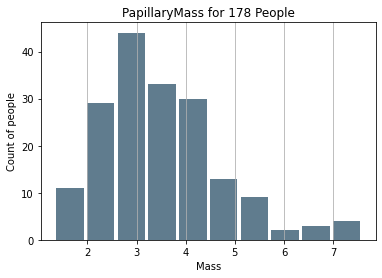

In [27]:
import pandas as pd

PapillaryMass = pd.Series(vals)
PapillaryMass.plot.hist(grid=True, bins=10, rwidth=0.9, color='#607c8e')
plt.title('PapillaryMass for 178 People')
plt.xlabel('Mass')
plt.ylabel('Count of people')
plt.grid(axis='y', alpha=0.75)